In [1]:
#for comparing the full-depth and single-depth goods classifications

%pylab inline
from astropy.io import fits as pyfits
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from astropy.io import fits
from astropy.table import Table,Column
import scipy.stats.distributions as dist

import os
import warnings
import requests

from PIL import Image
import urllib, cStringIO

mpl.rcParams['text.usetex']=True
mpl.rcParams['axes.linewidth'] = 3

warnings.filterwarnings('ignore', category=RuntimeWarning, append=True)
warnings.filterwarnings('ignore', category=UserWarning, append=True);



Populating the interactive namespace from numpy and matplotlib


In [2]:
gdata=Table.read('goods_shallow_1_full_2.fits')

In [3]:
#_1 refers to shallow depth and _2 refers to full depth:
print 'shallow: column _1 = %s, full: column_2 = %s' %(gdata['IMAGING_1'][0],gdata['IMAGING_2'][0])

shallow: column _1 = GOODS-N   , full: column_2 = GOODS_FULL


In [10]:
p_features_shallow='t01_smooth_or_features_a02_features_or_disk_best_fraction_1'
p_features_full='t01_smooth_or_features_a02_features_or_disk_best_fraction_2'

In [6]:
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

def deltaf_over_f(p_shallow,p_full):
    df_f = (p_full-p_shallow)/p_shallow
    return df_f


In [43]:
def compare_shallow_and_full_images(gal):
    f=plt.figure(figsize=(12,8))
    gs=gridspec.GridSpec(1,2)
    fs = 30
    #left: show shallow image
    ax1=plt.subplot(gs[0,0])
    plt.imshow(get_image_from_url(gal['shallow_url']))
    plt.tick_params(labelbottom='off',labelleft='off')

#        ax1.annotate('z: %s\n$\mu: %s$'%(round(gal['Z_BEST_1'],2),round(gal['MU_HI_1'],2)),fontsize=fs,xy=(0,1),
#            xycoords='axes fraction',verticalalignment='top',color='white')
#        ax1.annotate('%s'%gal['OBJNO_1'],fontsize=fs,xy=(1,1),
#            xycoords='axes fraction',verticalalignment='top',horizontalalignment='right',color='white')
#        ax1.annotate('$\mathrm{p_{features}: %s}$\n$\mathrm{p_{features,best}: %s}$'%(round(gal[p_features_shallow_weighted],2),round(gal[p_features_shallow_best],2)),fontsize=fs,xy=(0,0),
#            xycoords='axes fraction',color='white')

    plt.title('shallow depth',fontsize=25)
    #right: full image
    ax2=plt.subplot(gs[0,1])
    plt.imshow(get_image_from_url(gal['full_url']))
    plt.tick_params(labelbottom='off',labelleft='off')
 
#        ax2.annotate('z: %s\n$\mu: %s$'%(round(gal['Z_BEST_2'],2),round(gal['MU_HI_2'],2)),fontsize=fs,xy=(0,1),
#            xycoords='axes fraction',verticalalignment='top',color='white')
#    ax2.annotate('%s'%gal['OBJNO_2'],fontsize=fs,xy=(1,1),
#            xycoords='axes fraction',verticalalignment='top',horizontalalignment='right',color='white')
#        ax2.annotate('$\mathrm{p_{features}: %s}$\n$\mathrm{p_{features,best}: %s}$'%(round(gal[p_features_full_weighted],2),round(gal[p_features_full_best],2)),fontsize=fs,xy=(0,0),
#            xycoords='axes fraction',color='white')

    plt.title('full depth',fontsize=25)


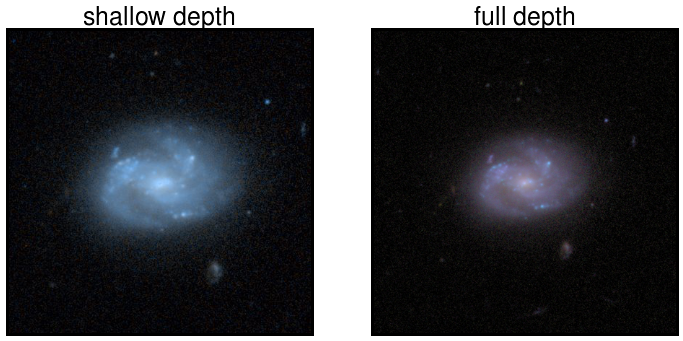

In [50]:
compare_shallow_and_full_images(gdata[2261])

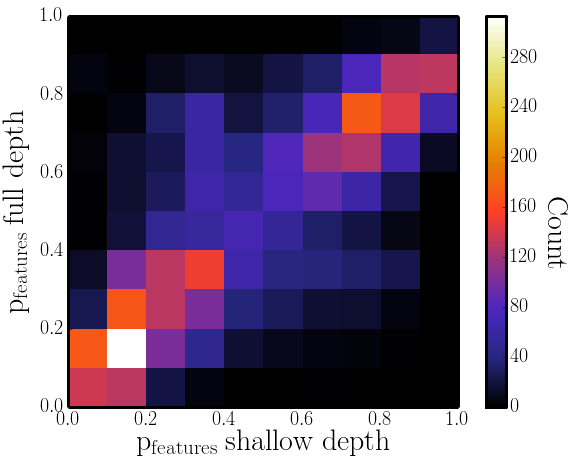

In [22]:
features_hist,xedges,yedges=np.histogram2d(gdata[p_features_shallow_best],gdata[p_features_full_best],range=((0,1),(0,1)))
extent=[xedges[0],xedges[-1],yedges[0],yedges[-1]]


mpl.rcParams['xtick.labelsize'] = 20
mpl.rcParams['ytick.labelsize'] = 20 

f=plt.figure(figsize=(10,7))
cmap=cm.CMRmap

plt.imshow(features_hist.T,origin='lower',extent=extent,interpolation='nearest',cmap=cmap)
plt.xlabel('$\mathrm{p_{features}~shallow~depth}$',fontsize=30)
plt.ylabel(r'$\mathrm{p_{features}~full~depth}$',fontsize=30)
f.text(.86,.5,'$\mathrm{Count}$',fontsize=30,rotation=270)
plt.colorbar()

plt.savefig('../writeup/figures/full_shallow_p_plot.pdf')

In [5]:
## Figures for appendix

## Define 'clean featured' sample as $p_{features}$ > 0.8, 'clean smooth' sample as $p_{features}$ < 0.2, and intermediate as anything in between. 

In [7]:
disk_cut = 0.8
smooth_cut = 0.2

In [11]:
smooth_to_smooth = (gdata[p_features_shallow]<smooth_cut) & (gdata[p_features_full]<smooth_cut)
smooth_to_int = (gdata[p_features_shallow]<smooth_cut) & (gdata[p_features_full]>smooth_cut) & (gdata[p_features_full] < disk_cut)
smooth_to_featured = (gdata[p_features_shallow]<smooth_cut) & (gdata[p_features_full]>disk_cut)

int_to_smooth = (gdata[p_features_shallow]>smooth_cut) & (gdata[p_features_shallow] < disk_cut) & (gdata[p_features_full]<smooth_cut)
int_to_int = (gdata[p_features_shallow]>smooth_cut) & (gdata[p_features_shallow] < disk_cut) & (gdata[p_features_full]>smooth_cut) & (gdata[p_features_full] < disk_cut)
int_to_featured = (gdata[p_features_shallow]>smooth_cut) & (gdata[p_features_shallow] < disk_cut) & (gdata[p_features_full]>disk_cut)

featured_to_smooth = (gdata[p_features_shallow]>disk_cut) & (gdata[p_features_full]<smooth_cut)
featured_to_int =  (gdata[p_features_shallow]>disk_cut) & (gdata[p_features_full]>smooth_cut) & (gdata[p_features_full] < disk_cut)
featured_to_featured = (gdata[p_features_shallow]>disk_cut) & (gdata[p_features_full]>disk_cut)

In [50]:
def plot_shallow_corrections(data,int_list,i,ax):
    gal = data[int_list[i]]
    try: 
        plt.imshow(get_image_from_url(gal['shallow_url']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{f_{features}: %s}$'%round(gal[p_features_shallow],2),fontsize=35,xy=(0.02,.02),
            xycoords='axes fraction',color='white')
    except IOError:
        pass

def plot_full_corrections(data,int_list,i,ax):
    gal = data[int_list[i]]
    try:
        plt.imshow(get_image_from_url(gal['full_url']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{f_{features}: %s}$'%round(gal[p_features_full],2),fontsize=35,xy=(0.02,.02),
            xycoords='axes fraction',color='white')
    except IOError:
        pass
    
def int_list(table_data):
    ints = np.linspace(0,len(table_data),len(table_data)+1)
    ints = [int(s) for s in ints]
    random.shuffle(ints)
    return ints


In [52]:
def plot_goods_comparisons(type1_to_type2,type1,type2):
    gs=gridspec.GridSpec(2,5)
    gs.update(wspace=0.01)
    gs.update(hspace=0.05)
 

    s_s = gdata[type1_to_type2]
    s_s_ints = int_list(s_s)



    ls = 25

    f=plt.figure(figsize=(25,10))
    for i in range(0,5):
        ax_s = plt.subplot(gs[0,i])
        try:
            plot_shallow_corrections(s_s,s_s_ints,i,ax_s)
        except IndexError:
            pass
        if i==0:
            plt.ylabel('shallow~depth~image',fontsize=ls)
        if i==4:
            ax_s.yaxis.set_label_position("right")
            plt.ylabel(type1,fontsize=ls,rotation=270,labelpad=25)

        ax_f = plt.subplot(gs[1,i])
        try:
            plot_full_corrections(s_s,s_s_ints,i,ax_f)
        except IndexError:
            pass
        if i==0:
            plt.ylabel('full~depth~image',fontsize=ls)
        if i==4:
            ax_f.yaxis.set_label_position("right")
            plt.ylabel(type2,fontsize=ls,rotation=270,labelpad=25)



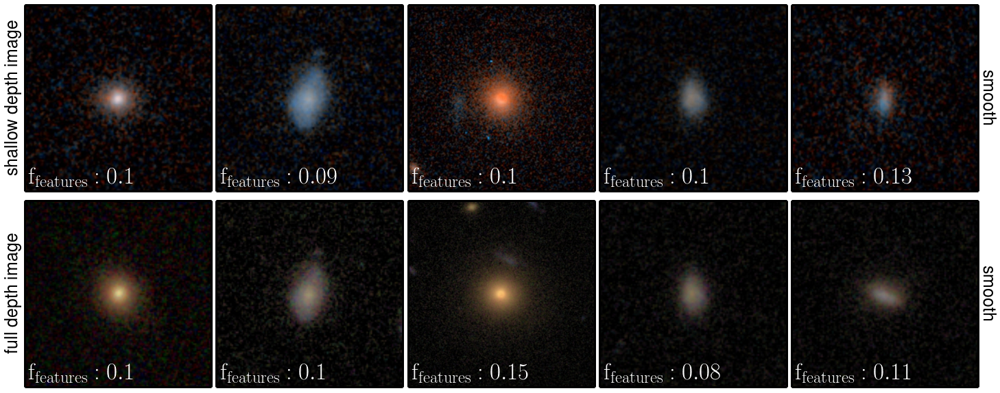

In [43]:
plot_goods_comparisons(smooth_to_smooth,'smooth','smooth')
plt.savefig('../writeup/smooth_to_smooth.pdf')

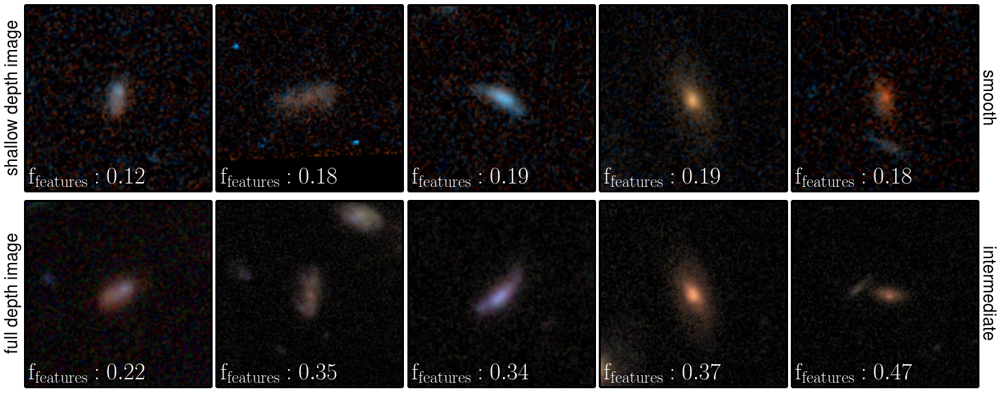

In [47]:
plot_goods_comparisons(smooth_to_int,'smooth','intermediate')
plt.savefig('../writeup/smooth_to_intermediate.pdf')

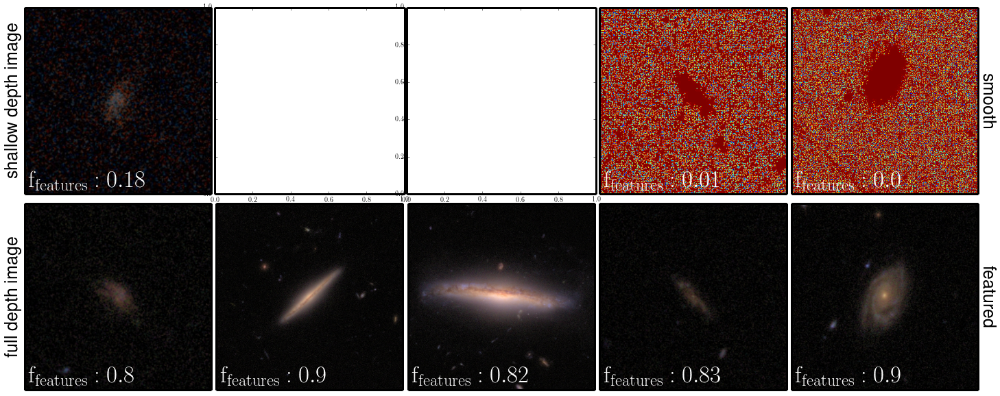

In [53]:
plot_goods_comparisons(smooth_to_featured,'smooth','featured')
plt.savefig('../writeup/smooth_to_featured.pdf')

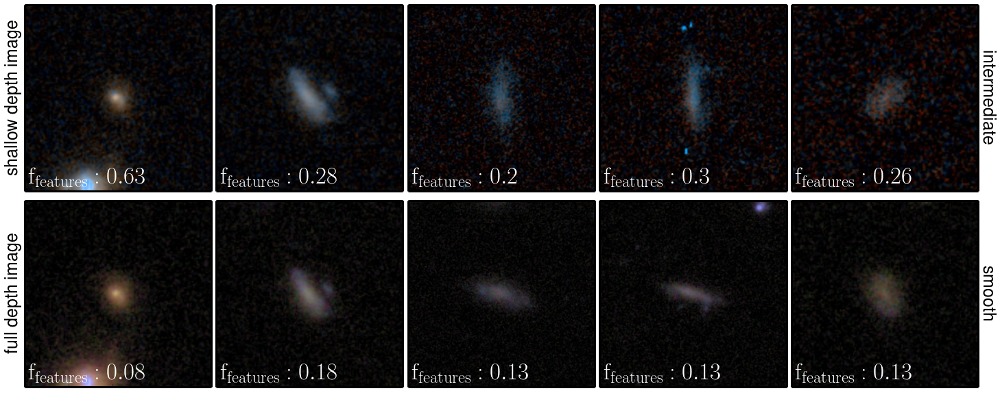

In [54]:
plot_goods_comparisons(int_to_smooth,'intermediate','smooth')
plt.savefig('../writeup/intermediate_to_smooth.pdf')

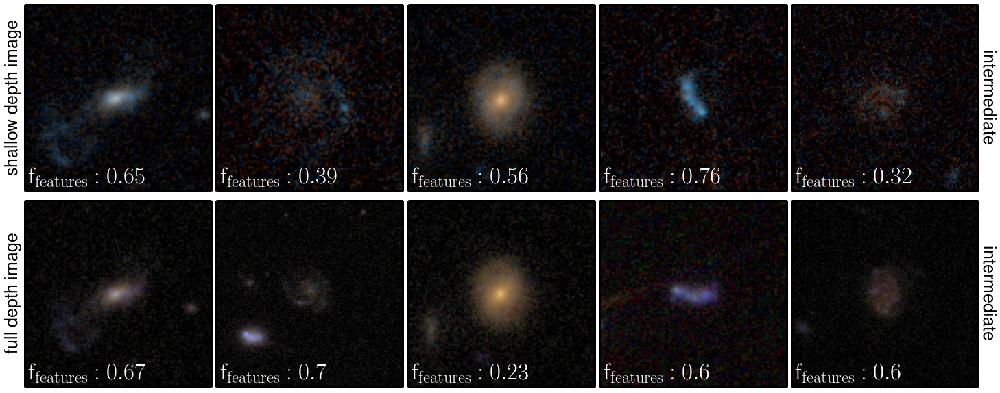

In [55]:
plot_goods_comparisons(int_to_int,'intermediate','intermediate')
plt.savefig('../writeup/intermediate_to_intermediate.pdf')

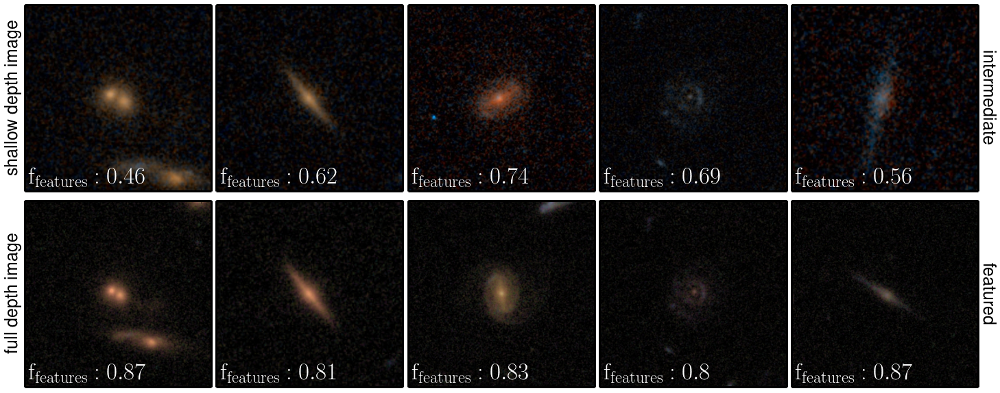

In [56]:
plot_goods_comparisons(int_to_featured,'intermediate','featured')
plt.savefig('../writeup/intermediate_to_featured.pdf')

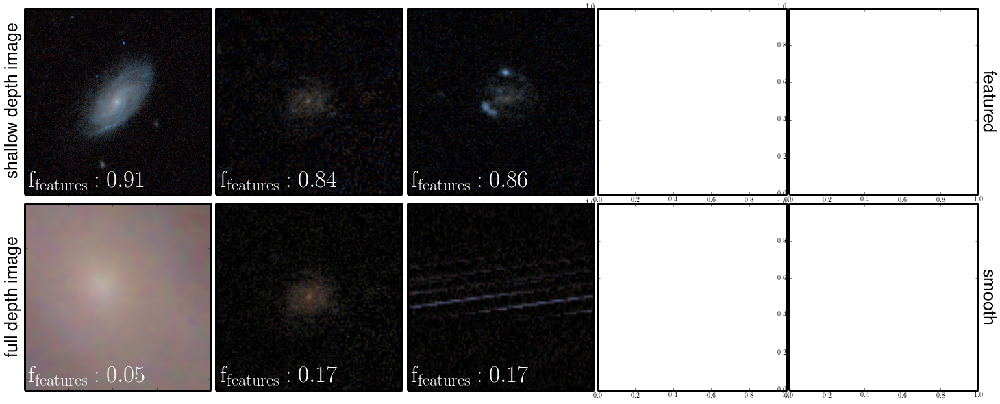

In [57]:
plot_goods_comparisons(featured_to_smooth,'featured','smooth')
plt.savefig('../writeup/featured_to_smooth.pdf')

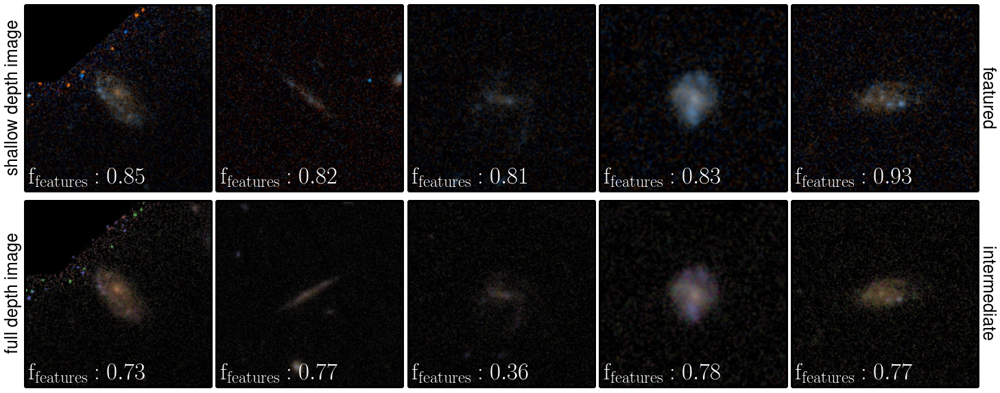

In [58]:
plot_goods_comparisons(featured_to_int,'featured','intermediate')
plt.savefig('../writeup/featured_to_intermediate.pdf')

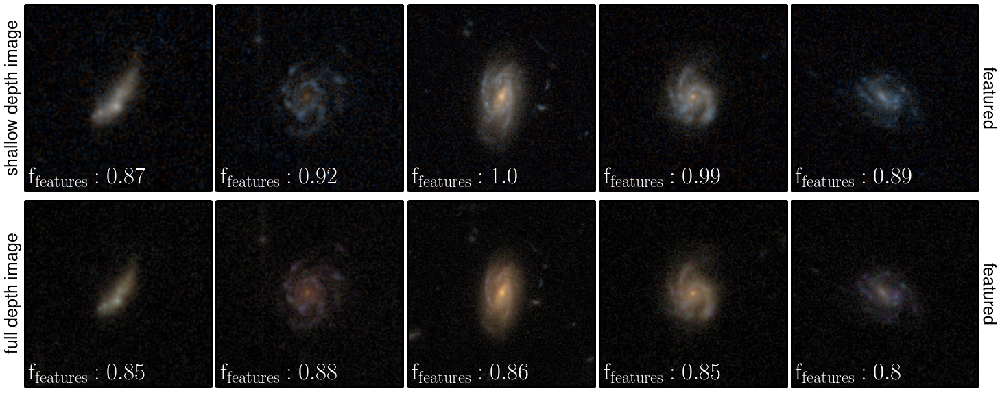

In [59]:
plot_goods_comparisons(featured_to_featured,'featured','featured')
plt.savefig('../writeup/featured_to_featured.pdf')